The original dataset can be found here: https://archive.ics.uci.edu/ml/datasets/Bank+Marketing

bank-additional-full.csv with all examples (41188) and 20 inputs, ordered by date from May 2008 to November 2010.

The scope of this marketing campaign is selling long-term deposits. For each call, information about the client and the outcome of the call is registered.

Direct marketing campaigns are a classical approach to increasing business revenue, informing potential customers about new products, and merchandising them. Having targeted marketing campaigns can significantly increase success rates and revenue
since the audience is based on precise criteria and the analysis of past marketing campaigns. Thus, extracting information about successful campaigns and customers can significantly reduce marketing costs and increase sales.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline
#%matplotlib notebook
plt.style.use('tableau-colorblind10')

In [2]:
bank_data = pd.read_csv(r'bank-additional-full.csv',sep=';')
bank_data.head().T

,0,1,2,3,4
age,56,57,37,40,56
job,housemaid,services,services,admin.,services
marital,married,married,married,married,married
education,basic.4y,high.school,high.school,basic.6y,high.school
default,no,unknown,no,no,no
housing,no,no,yes,no,no
loan,no,no,no,no,yes
contact,telephone,telephone,telephone,telephone,telephone
month,may,may,may,may,may
day_of_week,mon,mon,mon,mon,mon


In [3]:
bank_data.duplicated().sum()

12

There are 12 dulicated data, let's delete them.

In [4]:
bank_data.drop_duplicates(inplace = True)

In [5]:
"""
dimensionality of the data, columns, types and missing values
"""
print(f"Data dimension: {bank_data.shape}\n")
for col in bank_data.columns:
    print(f"Column: {col:15} | type: {str(bank_data[col].dtype):7} | missing values: {bank_data[col].isna().sum():3d}")

Data dimension: (41176, 21)

Column: age             | type: int64   | missing values:   0
Column: job             | type: object  | missing values:   0
Column: marital         | type: object  | missing values:   0
Column: education       | type: object  | missing values:   0
Column: default         | type: object  | missing values:   0
Column: housing         | type: object  | missing values:   0
Column: loan            | type: object  | missing values:   0
Column: contact         | type: object  | missing values:   0
Column: month           | type: object  | missing values:   0
Column: day_of_week     | type: object  | missing values:   0
Column: duration        | type: int64   | missing values:   0
Column: campaign        | type: int64   | missing values:   0
Column: pdays           | type: int64   | missing values:   0
Column: previous        | type: int64   | missing values:   0
Column: poutcome        | type: object  | missing values:   0
Column: emp.var.rate    | type: float64 |

There are 41,176 rows and 21 columns in this dataset. There is a mix of both categorical and numerical values in this dataset and no missing values.

In [6]:
bank_data.rename(columns = {'y' : 'output'},inplace=True)            
bank_data['job'] = bank_data['job'].str.replace('admin.','admin',regex = True) 
bank_data.sample(10)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,output
31217,37,blue-collar,married,basic.9y,no,no,no,cellular,may,wed,...,2,999,0,nonexistent,-1.8,92.893,-46.2,1.334,5099.1,no
27034,48,management,married,university.degree,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.021,5195.8,no
34174,36,admin,married,university.degree,no,no,no,cellular,may,wed,...,6,999,0,nonexistent,-1.8,92.893,-46.2,1.281,5099.1,no
18313,37,housemaid,single,professional.course,no,yes,no,cellular,jul,wed,...,8,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
1834,28,admin,single,university.degree,no,yes,no,telephone,may,fri,...,5,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
26367,38,management,married,professional.course,no,no,no,cellular,nov,thu,...,1,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,no
17699,42,services,single,unknown,unknown,yes,no,telephone,jul,tue,...,7,999,0,nonexistent,1.4,93.918,-42.7,4.961,5228.1,no
20275,34,admin,single,university.degree,no,yes,no,cellular,aug,mon,...,3,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
11673,31,student,single,unknown,unknown,yes,no,telephone,jun,fri,...,8,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1,no
4049,29,housemaid,single,high.school,no,no,no,telephone,may,mon,...,3,999,0,nonexistent,1.1,93.994,-36.4,4.858,5191.0,no


## Analyzing Distributions of Numerical Features in the Banking Dataset

In [7]:
numerical_features = bank_data.select_dtypes(include = np.number)
numerical_features.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41176.0,40.023800,10.420680,17.000,32.000,38.000,47.000,98.000
duration,41176.0,258.315815,259.305321,0.000,102.000,180.000,319.000,4918.000
campaign,41176.0,2.567879,2.770318,1.000,1.000,2.000,3.000,56.000
pdays,41176.0,962.464810,186.937102,0.000,999.000,999.000,999.000,999.000
previous,41176.0,0.173013,0.494964,0.000,0.000,0.000,0.000,7.000
emp.var.rate,41176.0,0.081922,1.570883,-3.400,-1.800,1.100,1.400,1.400
cons.price.idx,41176.0,93.575720,0.578839,92.201,93.075,93.749,93.994,94.767
cons.conf.idx,41176.0,-40.502863,4.627860,-50.800,-42.700,-41.800,-36.400,-26.900
euribor3m,41176.0,3.621293,1.734437,0.634,1.344,4.857,4.961,5.045
nr.employed,41176.0,5167.034870,72.251364,4963.600,5099.100,5191.000,5228.100,5228.100


The age of potential customer between 17 - 98 years old. 75% of the pdays values is 999. Noted that pdays means number of days that passed by after the client was last contacted from a 
previous campaign (999 means client was not previously contacted). 

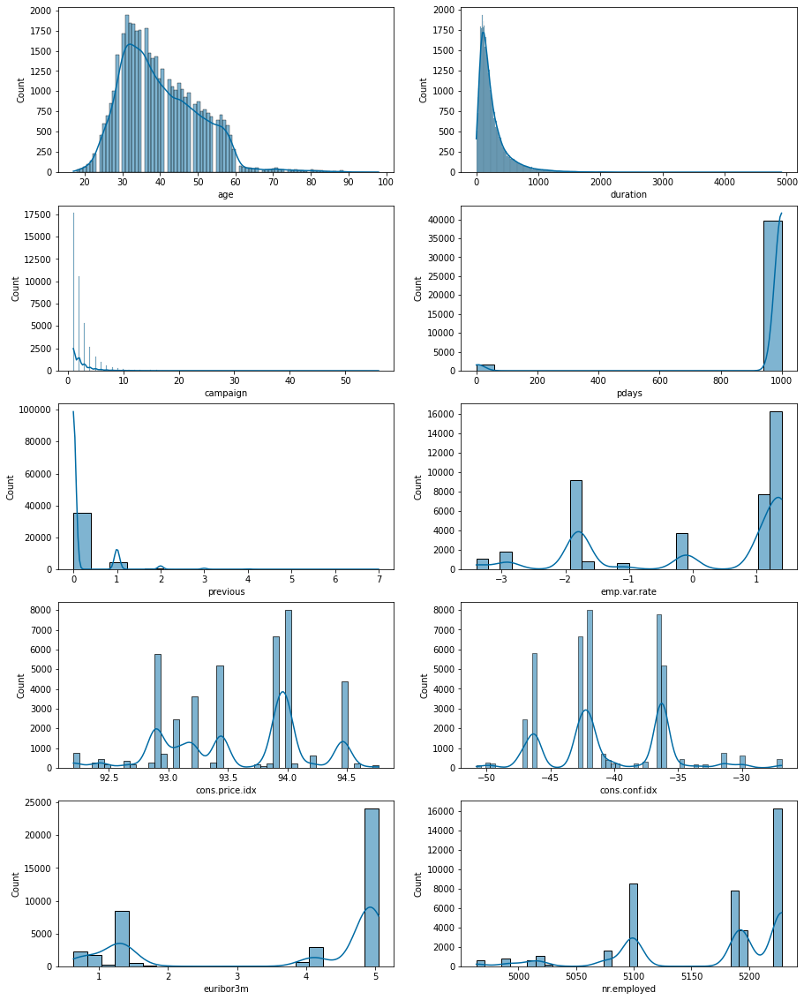

In [8]:
# plot distributions of numerical features
plt.figure(figsize = (15,20))
for index, col in enumerate(numerical_features):
    plt.subplot(5, 2, index+1)
    sns.histplot(data = numerical_features,x = col,kde = True)

From the preceding plot, we can see that, besides the age and duration columns, the rest of the numerical features do not seem to have a regular distribution of values since their distributions seem scattered and only a few values are present.

## Analyzing Distributions of Categorical Features in the Banking Dataset to have an idea of their distributions and the most frequent value in each categorical feature.

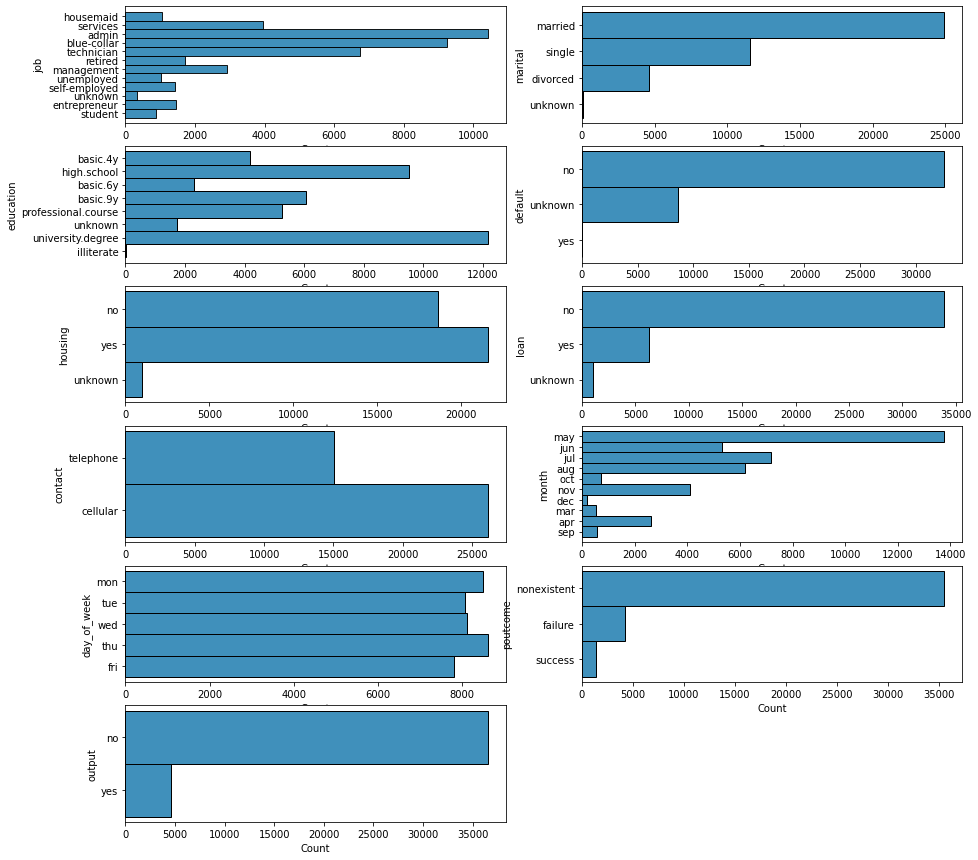

In [9]:
categorical_features = bank_data.select_dtypes(include = 'object')

plt.figure(figsize = (15,15))
for index, col in enumerate(categorical_features):
    plt.subplot(6, 2, index+1)
    sns.histplot(data = categorical_features,y = col)

Top 3 customer group works as admin, blue collar and technician.  Most of them is married. Most of the customer group has university degree. Most of the customer do not default their credit and  do not have a personal loan. Most of them last contacted on May last month. poutcome show most of them are first-time contacted.  

In [10]:
#Result of target achieved  
print('Total number of outcome:')   
print(bank_data[['output']].value_counts(ascending = True))
print()
print('Percentage:')
print(round(bank_data[['output']].value_counts(ascending = True, normalize = True)*100),10)

Total number of outcome:
output
yes        4639
no        36537
dtype: int64

Percentage:
output
yes       11.0
no        89.0
dtype: float64 10


Text(0.5, 1.0, 'Count of Customer Subscribe to Term Deposit\n')

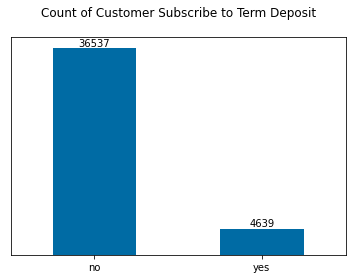

In [11]:
ax = bank_data['output'].value_counts().plot.bar(rot=0)
ax.bar_label(ax.containers[0], size = 10)
ax.axes.yaxis.set_visible(False)
plt.title('Count of Customer Subscribe to Term Deposit\n')

 From the preceding output, the rate of achieve target is low that is only 11% of the contacted customers
decided to accept the offer from the bank. 
Only 1 out of 10 people might agree to subscribe to the term deposit offer.

Text(0, 0.5, '\nType of job')

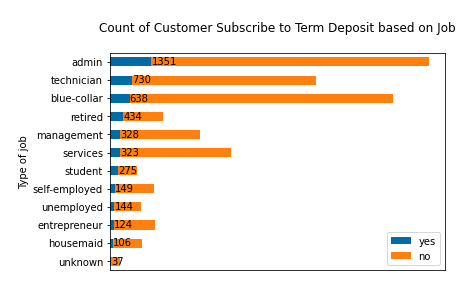

In [12]:
df = bank_data
job_vs_target = pd.DataFrame()
job_vs_target['yes'] = df[df['output']=='yes']['job'].value_counts(ascending=True)
job_vs_target['no'] = df[df['output']=='no']['job'].value_counts(ascending=True)
ax = job_vs_target.plot.barh(stacked = True,
                             title = '\nCount of Customer Subscribe to Term Deposit based on Job\n')
ax.bar_label(ax.containers[0], size=10)
ax.axes.xaxis.set_visible(False)
plt.ylabel('\nType of job')

The admin, technician, blue-collar, retired and management are the top 5 type of job who most likely subscribe to a term deposit.

In [13]:
target_group = job_vs_target.sort_values(by='yes',ascending=False).head()

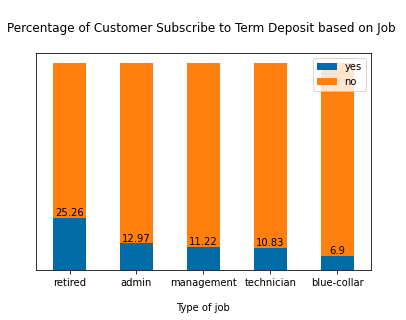

In [14]:
#normalize so that each row sums to 1
job_outcome_pcts = ((target_group
     .div(target_group.sum(1),axis=0))
    *100).sort_values(by='no')

ax = round(job_outcome_pcts,2).plot.bar(stacked=True,
                                        rot=0,
                                         title='\nPercentage of Customer Subscribe to Term Deposit based on Job \n')
plt.xlabel('\nType of job')
ax.bar_label(ax.containers[0], size=10)
ax.axes.yaxis.set_visible(False)

From the top 5 type of jobs , percentage wise people who retired or work as admin are most likely to subscribe to term deposit. 

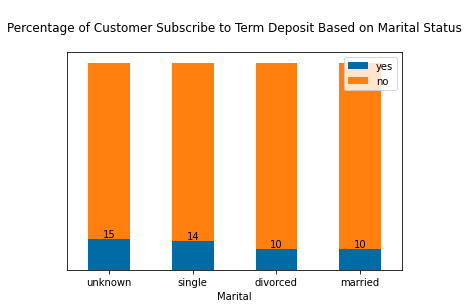

In [15]:
marital_outcome = pd.DataFrame()
marital_outcome['yes'] = df[df['output']=='yes']['marital'].value_counts()
marital_outcome['no'] = df[df['output']=='no']['marital'].value_counts()
marital_percent = ((marital_outcome.div(marital_outcome.sum(1),axis=0)*100)).sort_values(by='no')
ax = round((marital_percent*1),0).plot.bar(stacked=True,
                                           rot=0,
                                         title = '\nPercentage of Customer Subscribe to Term Deposit Based on Marital Status\n')
plt.xlabel('Marital')
ax.bar_label(ax.containers[0], size=10)
ax.axes.yaxis.set_visible(False)

Customers who were single were most likely to subscribe as compared to customers who are divorced or married.

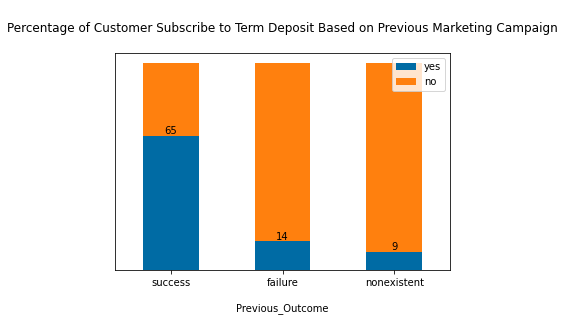

In [16]:
previous_outcome = pd.DataFrame()
previous_outcome['yes'] = df[df['output']=='yes']['poutcome'].value_counts()
previous_outcome['no'] = df[df['output']=='no']['poutcome'].value_counts()
previous_outcome_percent = ((previous_outcome.div(previous_outcome.sum(1),axis=0)*100)).sort_values(by='no')
ax = round((previous_outcome_percent*1),0).plot.bar(stacked=True,
                                           rot=0,
                        title = '\nPercentage of Customer Subscribe to Term Deposit Based on Previous Marketing Campaign\n')
plt.xlabel('\nPrevious_Outcome')
ax.bar_label(ax.containers[0], size=10)
ax.axes.yaxis.set_visible(False)

Customers who successfully subscribed from the previous marketing campaign will be most likely to subscribe again with 65% rate.

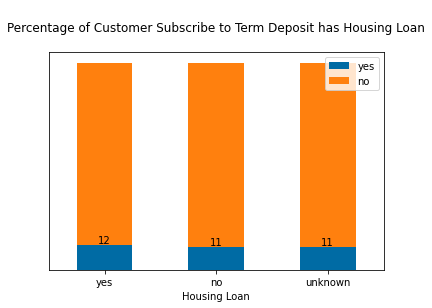

In [17]:
house_outcome = pd.DataFrame()
house_outcome['yes'] = df[df['output']=='yes']['housing'].value_counts()
house_outcome['no'] = df[df['output']=='no']['housing'].value_counts()
house_outcome_percent = ((house_outcome.div(house_outcome.sum(1),axis=0)*100)).sort_values(by='no')
ax = round((house_outcome_percent*1),0).plot.bar(stacked=True,
                                           rot=0,
                        title = '\nPercentage of Customer Subscribe to Term Deposit has Housing Loan\n')
plt.xlabel('Housing Loan')
ax.bar_label(ax.containers[0], size=10)
ax.axes.yaxis.set_visible(False)

Looks like having a house loan or not do not give any affect toward decision to subscribe to term deposit.

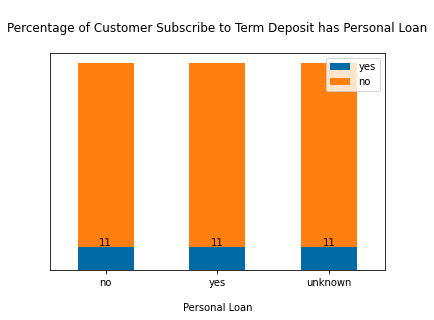

In [18]:
loan_outcome = pd.DataFrame()
loan_outcome['yes'] = df[df['output']=='yes']['loan'].value_counts()
loan_outcome['no'] = df[df['output']=='no']['loan'].value_counts()
loan_outcome_percent = ((loan_outcome.div(loan_outcome.sum(1),axis=0)*100)).sort_values(by='no')
ax = round((loan_outcome_percent*1),0).plot.bar(stacked=True,
                                           rot=0,
                        title = '\nPercentage of Customer Subscribe to Term Deposit has Personal Loan\n')
plt.xlabel('\nPersonal Loan')
ax.bar_label(ax.containers[0], size=10)
ax.axes.yaxis.set_visible(False)

Looks like having a personal loan or not do not give any affect toward decision to subscribe to term deposit.

<div class="alert alert-block alert-info">
    <b>Key takeaway:</b> The admin, technician, blue-collar, retired and management are the top 5 type of job who most likely subscribe to a term deposit. From the top 5 type of jobs , percentage wise people who retired or work as admin are most likely to subscribe to term deposit. Customers who were single were most likely to subscribe as compared to customers who are divorced or married. Customers who successfully subscribed from the previous marketing campaign will be most likely to subscribe again with 65% rate. Data shows having a personal loan, housing loan or not do not give any affect toward decision to subscribe to term deposit. The next time marketing team want to target their future customer they can refer to this insight to profile their customer attribute either when doing a direct call marketing or fb ads marketing.
    </div>	

In [19]:
# EDA process also can be speed up using pandas profiling.

import pandas_profiling
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
profile=df.profile_report(title='bank_data')
profile.to_file(output_file='bank_data_profiling.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]